In [1]:
from math import*
from numpy import*
from scipy import*
from scipy.integrate import*
from pylab import*
%matplotlib inline

from JSAnimation import IPython_display
from JSAnimation.IPython_display import display_animation
from matplotlib import animation

In [2]:
def osciladores(x,t,m1=1.,m2=2.,k1=1.,k2=1.,k3=1.):
    campo= [ x[2]/m1 , x[3]/m2 , -(k1+k2)*x[0] + k2*x[1] , k2*x[0] - (k2+k3)*x[1] ]
    return campo

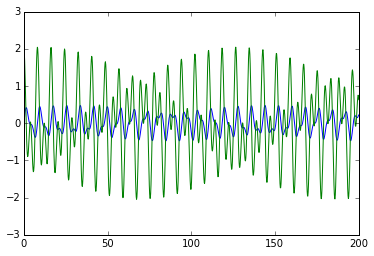

In [3]:
tiempo = linspace(0,200,1000)
cond_ini = [0.,0.,.5,.5]
solucion = odeint(osciladores,cond_ini,tiempo)
cond_ini_Juan = [2.,1.,-.2,.7]
solucion_Juan = odeint(osciladores,cond_ini_Juan,tiempo)
#print solucion[:,0]
plot(tiempo,solucion[:,0]) #ver la periodicidad del movimiento
plot(tiempo,solucion_Juan[:,0])

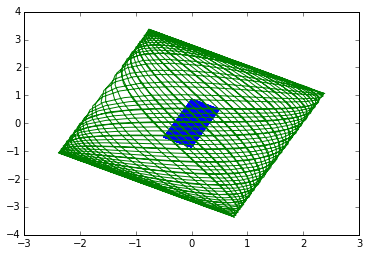

In [4]:
plot(solucion[:,2],solucion[:,3]) #proyección del espacio fase a 2D, espacio fase vive en 4D
plot(solucion_Juan[:,2],solucion_Juan[:,3])

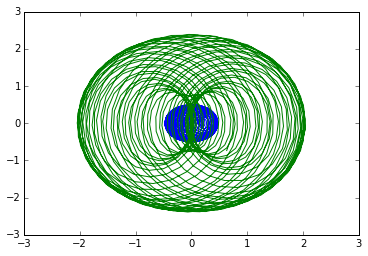

In [5]:
plot(solucion[:,0],solucion[:,2]) #proyección del espacio fase a 2D, espacio fase vive en 4D
plot(solucion_Juan[:,0],solucion_Juan[:,2])

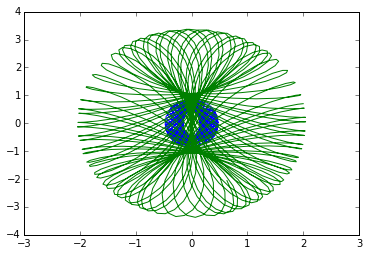

In [6]:
plot(solucion[:,0],solucion[:,3]) #proyección del espacio fase a 2D, espacio fase vive en 4D
plot(solucion_Juan[:,0],solucion_Juan[:,3])

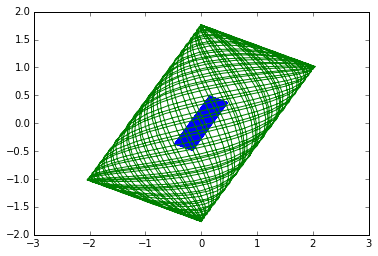

In [7]:
plot(solucion[:,0],solucion[:,1]) #proyección del espacio fase a 2D, espacio fase vive en 4D
plot(solucion_Juan[:,0],solucion_Juan[:,1])

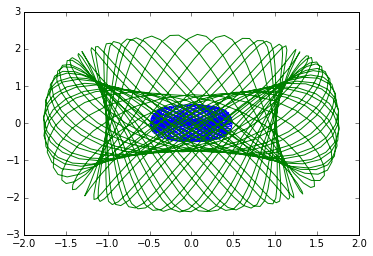

In [8]:
plot(solucion[:,1],solucion[:,2]) #proyección del espacio fase a 2D, espacio fase vive en 4D
plot(solucion_Juan[:,1],solucion_Juan[:,2])

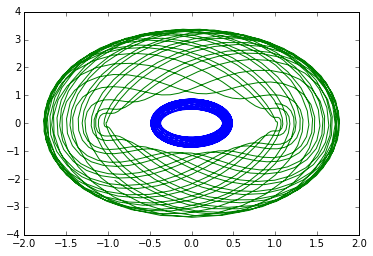

In [9]:
plot(solucion[:,1],solucion[:,3]) #proyección del espacio fase a 2D, espacio fase vive en 4D
plot(solucion_Juan[:,1],solucion_Juan[:,3])

501 1000


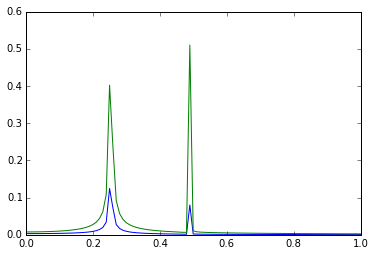

In [10]:
trans = abs(rfft(array(solucion[:,0])))/ len(solucion[:,0]) # se divide entre la norma para normalizar
trans_Juan = abs(rfft(array(solucion_Juan[:,0])))/ len(solucion_Juan[:,0])
xlim(0,1)
delta_t = tiempo[1] - tiempo[0]#para normalizar las frecuencias se divide entre blaah
omega = linspace(0 , 1.0/delta_t , len(solucion[:,0])/2 + 1 )
#plot(trans) #si quiero puedo dejar al sistema con una sola frecuencia con ciertas cond. ini.
print len(omega), len(tiempo)
plot(omega,trans)
plot(omega,trans_Juan)


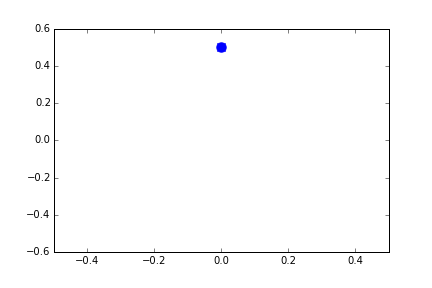
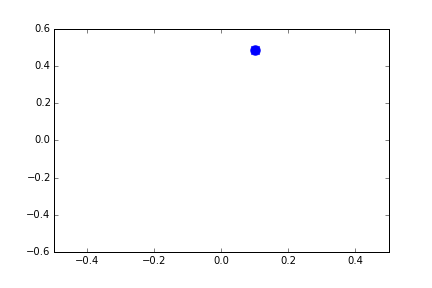
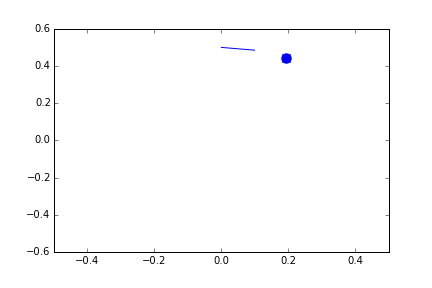
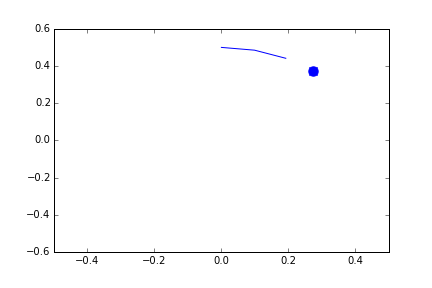
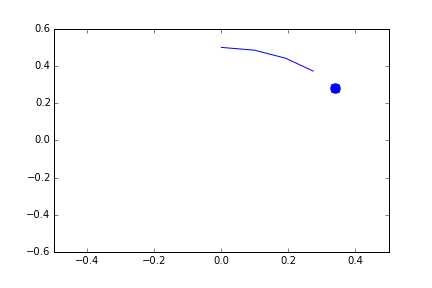
...
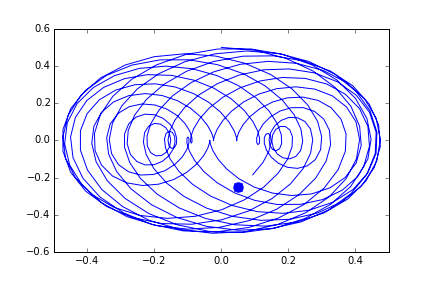
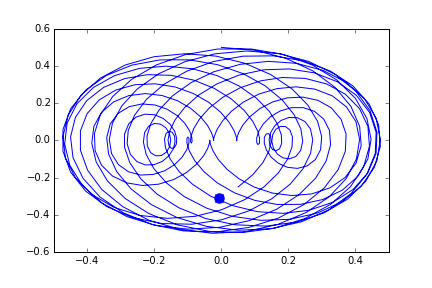
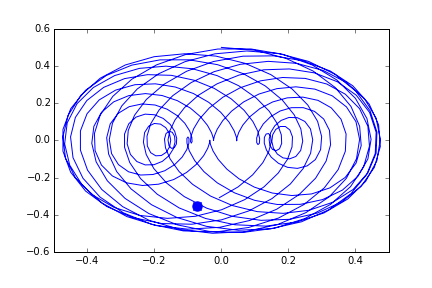
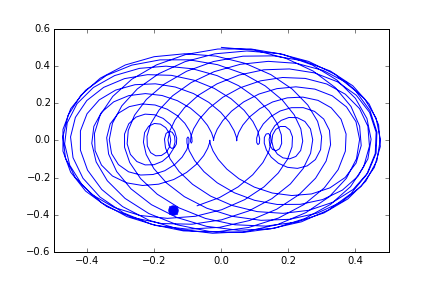
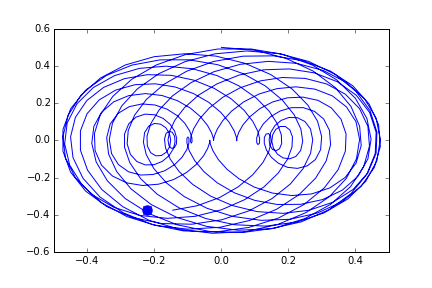

In [11]:
fig = plt.figure()
ax = plt.axes( xlim=(-0.5,0.5),ylim=(-0.6,0.6) )
particle,  = ax.plot( [] , [], 'b.' , markersize = 20 )
line, = ax.plot( [] , [] , '-')

def init(): #Toda animación que usemos con JSAnimation debe tener dos funciones, una que sea la inicial y otra que se itera.
    particle.set_data( [], [] )
    line.set_data( [] , [] )
    return particle, line,

def anima(i):
    particle.set_data( solucion[:,0][i], solucion[:,2][i] ) #necesita un índice, para recorrerse sobre los índices usados antes
    line.set_data( solucion[:,0][:i] , solucion[:,2][:i] )
    return particle, line,

animacion = animation.FuncAnimation(fig,anima,init_func=init,frames=500,interval=50,blit=True)
display_animation(animacion)